## 최초 테스트 코드

### Init

In [1]:
# Colab 환경에서 필요한 패키지 설치
%%capture
%pip install diffusers transformers accelerate
%pip install torch --upgrade

In [2]:
from diffusers import AutoPipelineForText2Image
import torch

def apply_lora(pipeline, lora_path, weight_file, adapter_name="temp", strength=1.0):
    # adapters가 있는 경우에만 삭제 시도
    if hasattr(pipeline, "adapters") and adapter_name in getattr(pipeline.adapters, "adapters", {}):
        del pipeline.adapters.adapters[adapter_name]

    pipeline.load_lora_weights(
        lora_path,
        weight_name=weight_file,
        adapter_name=adapter_name
    )
    pipeline.set_adapters([adapter_name], adapter_weights=[strength])



In [3]:
# # 모델 호출 및 이미지 생성 코드
# from diffusers import StableDiffusionPipeline
# from diffusers import AutoPipelineForText2Image
# import torch
# import matplotlib.pyplot as plt
# from PIL import Image

### Memory Monitor

In [4]:
print(f"Allocated: {torch.cuda.memory_allocated() / 1e9:.2f} GB")
print(f"Reserved : {torch.cuda.memory_reserved() / 1e9:.2f} GB")


Allocated: 0.00 GB
Reserved : 0.00 GB


### SD 1.5 - 지브리 테스트

In [ ]:
# 사용할 모델 설정 (Ghibli-Diffusion 예시)
model_id = "nitrosocke/Ghibli-Diffusion"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")  # GPU 사용
print(f"Using device : {pipe.device}")

# 생성할 이미지에 대한 프롬프트 설정
title = 'cats'
prompt = "ghibli style, A fluffy, light gray-white Neva Masquerade cat with blue eyes lies on a light wooden table in a bright room with large windows and white walls. The scene is serene and softly lit."
prompt_winter = 'A winter scene in a traditional Korean garden. Ghibli style. A snow-covered courtyard with traditional Korean houses, featuring dark-colored wooden architecture with tiled roofs.  The roofs and trees are heavily laden with snow.  The houses are situated slightly off-center to the right side of the image.  Branches of trees, particularly red maple leaves, are visible beneath the snow.  The snow blankets the ground, and a path of brown dirt is visible. The scene is peaceful and serene, with a light, overcast sky. The perspective is at ground level looking outwards, showing the buildings and landscaping. The colors are muted and cool, featuring shades of white, gray, brown, and dark red from the maple leaves. The atmosphere is calm and quiet, characteristic of a snowy winter day.'
image = pipe(prompt).images[0]

# 생성된 이미지 저장
image.save("ghibli_" + title + ".png")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Using device : cuda:0


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
# 여러 이미지 동시 테스트
model_id = "nitrosocke/Ghibli-Diffusion"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")  # GPU 사용
print(f"Using device : {pipe.device}")

version = ['1st', '2nd', '3rd', '4th']
style = 'ghibli style, '
title = 'snowy_library'
prompt = [
    "a serene snowy mountain landscape, with soft, gentle snowfall during daytime",
    "a traditional Japanese wooden library, featuring intricate architectural details and warm wooden textures",
    "bathed in gentle sunlight that highlights the falling snow, creating a harmonious contrast between light and shadow",
    "a peaceful and enchanting scene, reminiscent of a handcrafted illustration",
]

for i in range(4):
    image = pipe(style + prompt[i]).images[0]
    image.save("output_" + title + "_" + version[i] + ".png")
    image.show()


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/546 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.84k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/581 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Using device : cuda:0


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

### SD 1.5 - LoRA 지브리 테스트

In [ ]:
pipeline = AutoPipelineForText2Image.from_pretrained('runwayml/stable-diffusion-v1-5', torch_dtype=torch.float16).to('cuda')
pipeline.load_lora_weights('artificialguybr/studioghibli-redmond-1-5v-studio-ghibli-lora-for-liberteredmond-sd-1-5', weight_name='StudioGhibliRedmond-15V-LiberteRedmond-StdGBRedmAF-StudioGhibli.safetensors')

prompt = "Two fluffy, light gray-white cats, likely Neva Masquerade or similar breed, sit on a light wooden table.  The cat on the front is slightly lower and lying down, its paws resting on the table.  The cat in front is facing slightly to its right, while the cat behind is facing forward and slightly to the left.  Both cats have large, expressive blue eyes and soft, fluffy fur.  The cats' body types are slender and medium-sized.  The table is a light, natural wood tone with a simple design.  The background is a soft, out-of-focus setting of a bright, white-walled room with large windows, showing a natural and calming atmosphere.  The lighting is soft and even, highlighting the cats' features. The composition is simple and symmetrical, focusing on the cats' interaction and the gentle ambiance.  The perspective is slightly above the table level.  The overall color palette is light and neutral, with muted tones of white, light gray, and light wood.  The style is serene and domestic."
image = pipeline(f'{prompt}, StdGBRedmAF, Studio Ghibli').images[0]

title = 'cats'
image.save("ghibli_" + title + ".png")
image.show()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (218 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["soft , fluffy fur . the cats ' body types are slender and medium - sized . the table is a light , natural wood tone with a simple design . the background is a soft , out - of - focus setting of a bright , white - walled room with large windows , showing a natural and calming atmosphere . the lighting is soft and even , highlighting the cats ' features . the composition is simple and symmetrical , focusing on the cats ' interaction and the gentle ambiance . the perspective is slightly above the table level . the overall color palette is light and neutral , with muted tones of white , light gray , and light wood . the style is serene and domestic ., stdgbredmaf , studio ghibli"]


  0%|          | 0/50 [00:00<?, ?it/s]

### SD 2.1 - basic test


In [18]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained('artificialguybr/freedom', torch_dtype=torch.float16).to('cuda')
pipeline.load_lora_weights('artificialguybr/studioghibli-redmond-2-1v-studio-ghibli-lora-for-freedom-redmond-sd-2-1', weight_name='StudioGhibliRedmond21V-FreedomRedmond-StudioGhibli-StdGBRedmAF.safetensors')
image = pipeline('A pirate boy, cute, StdGBRedmAF, Studio Ghibli').images[0]
image


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading default_0 was unsucessful with the following error: 
Error(s) in loading state_dict for UNet2DConditionModel:
	size mismatch for down_blocks.0.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for down_blocks.0.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for down_blocks.0.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for down_blocks.0.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for down_blocks.0.attentions.1.proj_in.lora_A.def

RuntimeError: Error(s) in loading state_dict for UNet2DConditionModel:
	size mismatch for down_blocks.0.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for down_blocks.0.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for down_blocks.0.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for down_blocks.0.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for down_blocks.0.attentions.1.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for down_blocks.0.attentions.1.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for down_blocks.0.attentions.1.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for down_blocks.0.attentions.1.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for down_blocks.1.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for down_blocks.1.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for down_blocks.1.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for down_blocks.1.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for down_blocks.1.attentions.1.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for down_blocks.1.attentions.1.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for down_blocks.1.attentions.1.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for down_blocks.1.attentions.1.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for down_blocks.2.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for down_blocks.2.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for down_blocks.2.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for down_blocks.2.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for down_blocks.2.attentions.1.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for down_blocks.2.attentions.1.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for down_blocks.2.attentions.1.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for down_blocks.2.attentions.1.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for up_blocks.1.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for up_blocks.1.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for up_blocks.1.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for up_blocks.1.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for up_blocks.1.attentions.1.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for up_blocks.1.attentions.1.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for up_blocks.1.attentions.1.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for up_blocks.1.attentions.1.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for up_blocks.1.attentions.2.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for up_blocks.1.attentions.2.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for up_blocks.1.attentions.2.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for up_blocks.1.attentions.2.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for up_blocks.2.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for up_blocks.2.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for up_blocks.2.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for up_blocks.2.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for up_blocks.2.attentions.1.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for up_blocks.2.attentions.1.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for up_blocks.2.attentions.1.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for up_blocks.2.attentions.1.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for up_blocks.2.attentions.2.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for up_blocks.2.attentions.2.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for up_blocks.2.attentions.2.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 640, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 640]).
	size mismatch for up_blocks.2.attentions.2.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([640, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([640, 64]).
	size mismatch for up_blocks.3.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for up_blocks.3.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for up_blocks.3.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for up_blocks.3.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for up_blocks.3.attentions.1.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for up_blocks.3.attentions.1.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for up_blocks.3.attentions.1.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for up_blocks.3.attentions.1.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for up_blocks.3.attentions.2.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for up_blocks.3.attentions.2.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for up_blocks.3.attentions.2.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 320, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 320]).
	size mismatch for up_blocks.3.attentions.2.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([320, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([320, 64]).
	size mismatch for mid_block.attentions.0.proj_in.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for mid_block.attentions.0.proj_in.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).
	size mismatch for mid_block.attentions.0.proj_out.lora_A.default_0.weight: copying a param with shape torch.Size([64, 1280, 1, 1]) from checkpoint, the shape in current model is torch.Size([64, 1280]).
	size mismatch for mid_block.attentions.0.proj_out.lora_B.default_0.weight: copying a param with shape torch.Size([1280, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([1280, 64]).

### SD 2.1 - with LoRA

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

# Stable Diffusion 2.1 모델 로드
pipeline = StableDiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1",
    torch_dtype=torch.float16,
    revision="fp16",
    use_safetensors=True
).to("cuda")

# LoRA 적용
lora_model_id = "artificialguybr/studioghibli-redmond-2-1v-studio-ghibli-lora-for-freedom-redmond-sd-2-1"
lora_weight_name = "StudioGhibliRedmond21V-FreedomRedmond-StudioGhibli-StdGBRedmAF.safetensors"
pipeline.load_lora_weights(lora_model_id, weight_name=lora_weight_name)

# 프롬프트 설정
positive_prompt = (
    "StdGBRedmAF, Studio Ghibli style, "
    "A fluffy white cat sitting on a wooden table with assorted fresh fruits, photorealistic lighting, "
    "warm afternoon sunlight, highly detailed cat face, soft fur, vibrant fruit textures, cozy room interior, 8k"
)
negative_prompt = (
    "blurry, deformed face, extra limbs, distorted fruits, low quality, low resolution, bad anatomy, "
    "mutated features, unnatural shadows"
)

# 이미지 생성
image = pipeline(prompt=positive_prompt, negative_prompt=negative_prompt).images[0]
image.show()


### SDXL - basic test


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

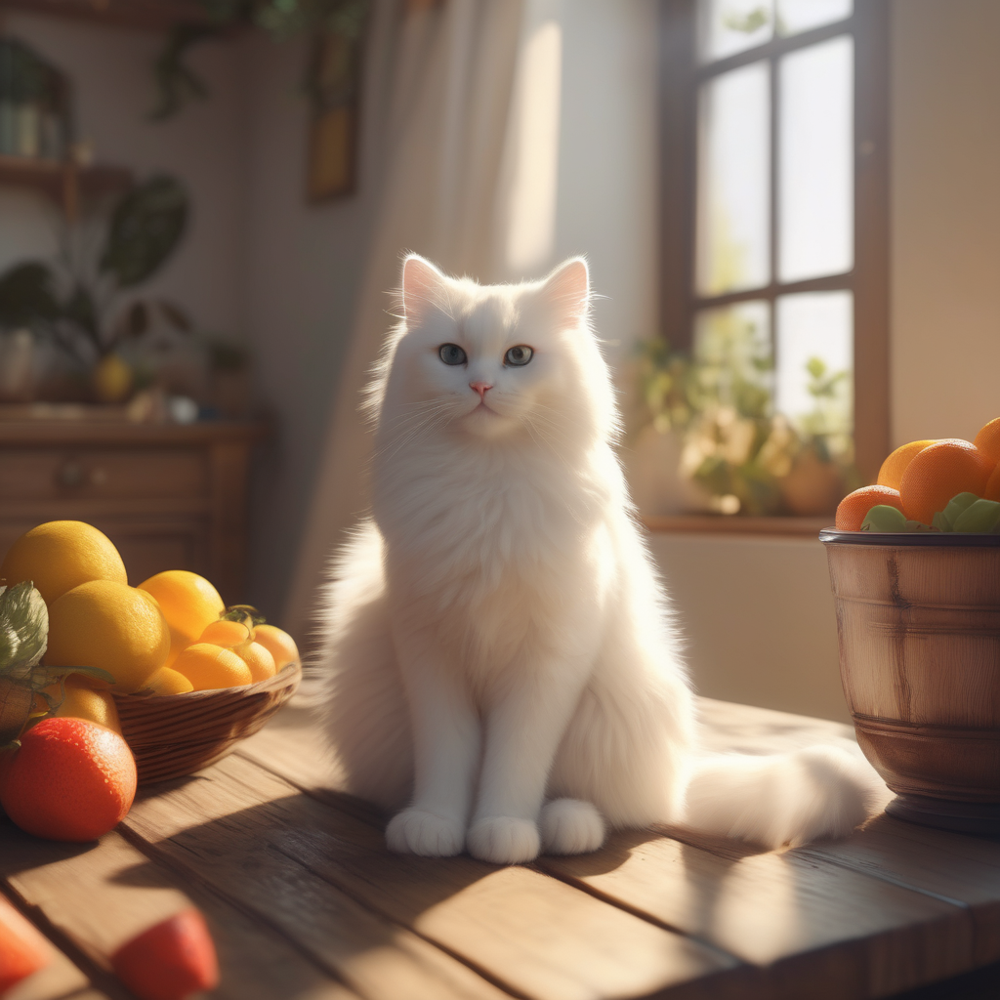

In [ ]:
# 1st - basic prompt upgrade version

from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

prompt = (
    "A fluffy white cat sitting elegantly on a wooden table with assorted fresh fruits like oranges, "
    "grapes, lemons, and strawberries. Sunlight streaming through the window, cozy warm interior, "
    "highly detailed, photorealistic, warm color palette, 8k"
)

image = pipeline(prompt=prompt).images[0]
image


  0%|          | 0/50 [00:00<?, ?it/s]

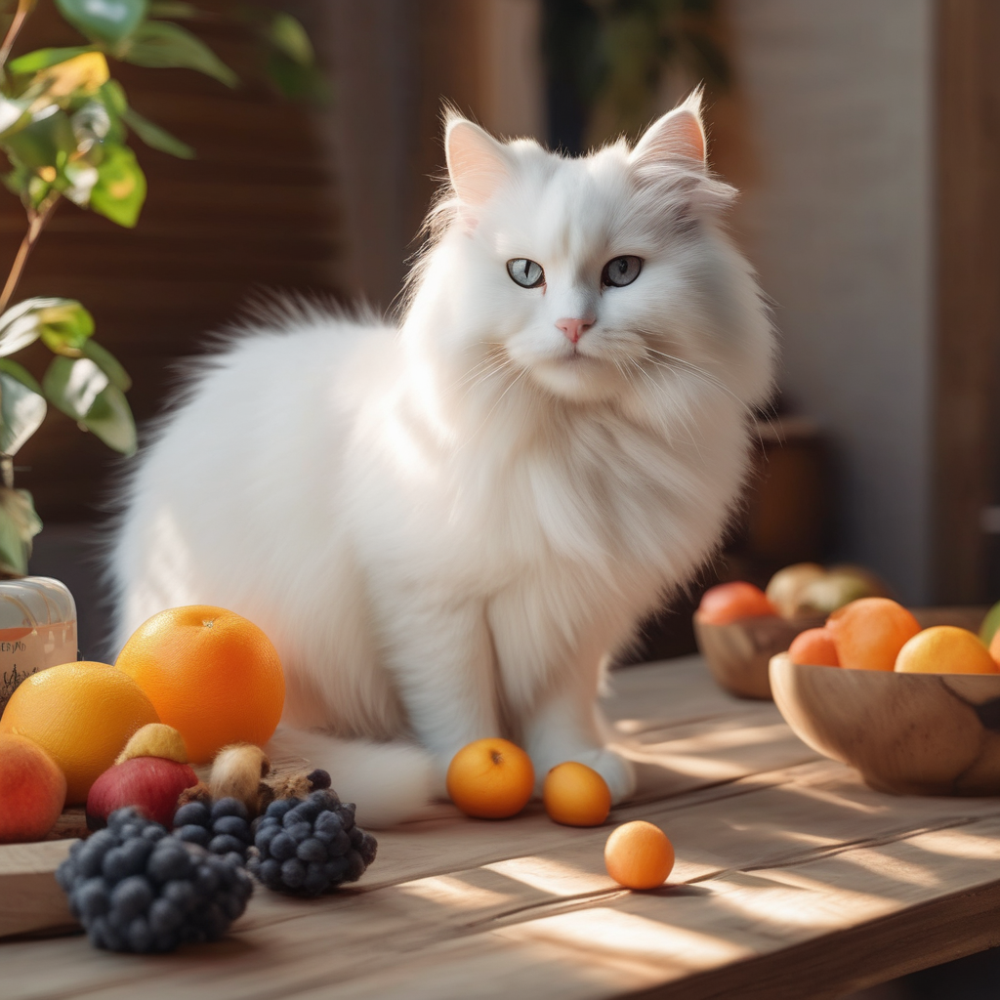

In [ ]:
# 2nd - positive, negative prompt version

positive_prompt = (
    "A fluffy white cat sitting on a wooden table with assorted fresh fruits, photorealistic lighting, "
    "warm afternoon sunlight, highly detailed cat face, soft fur, vibrant fruit textures, cozy room interior, 8k"
)

negative_prompt = (
    "blurry, deformed face, extra limbs, distorted fruits, low quality, low resolution, bad anatomy, "
    "mutated features, unnatural shadows"
)

image = pipeline(prompt=positive_prompt, negative_prompt=negative_prompt).images[0]
image


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

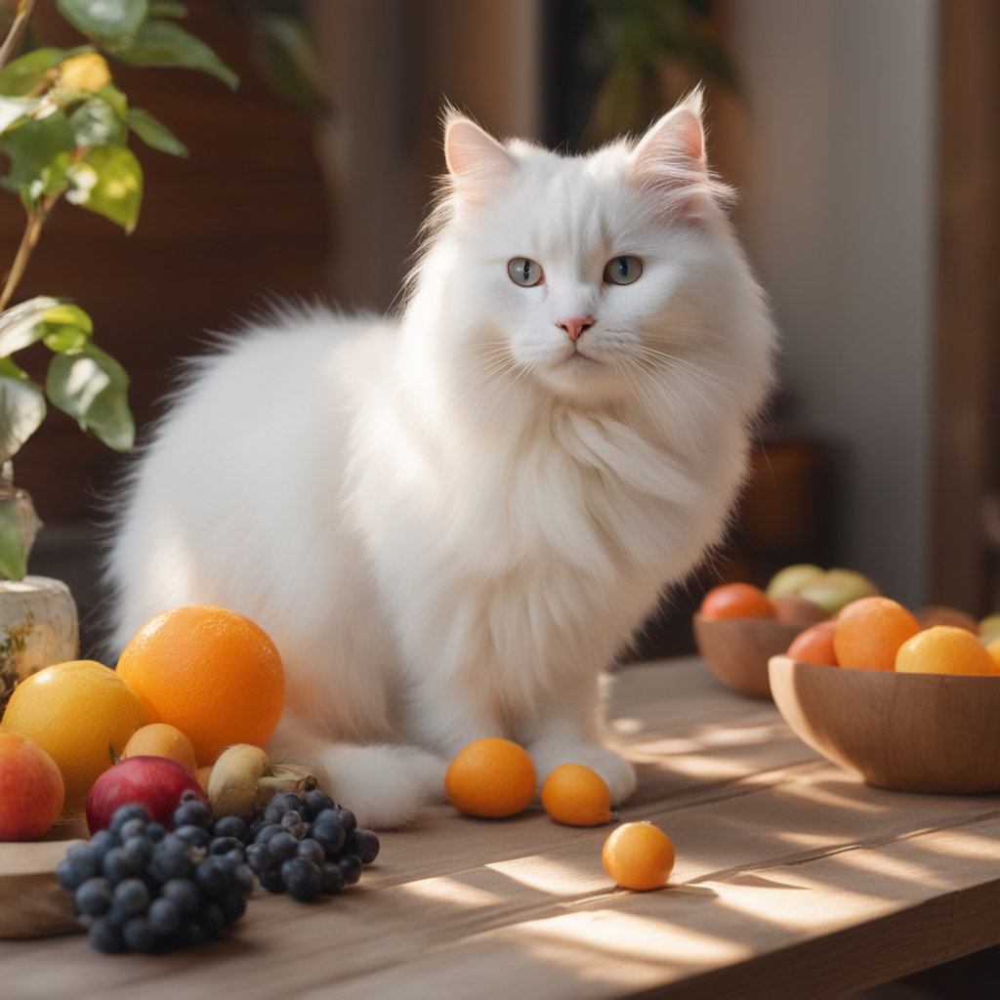

In [ ]:
# 3rd - with refiner version

from diffusers import StableDiffusionXLImg2ImgPipeline

# base pipeline으로 1차 생성
initial_image = image # from 2nd

# refiner pipeline 로드
refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# refiner로 다듬기
refined_image = refiner(
    prompt=positive_prompt,
    negative_prompt=negative_prompt,
    image=image,
    strength=0.2  # 보정 강도 (0.2~0.5 사이 추천)
).images[0]

refined_image


### SDXL - with LoRA

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

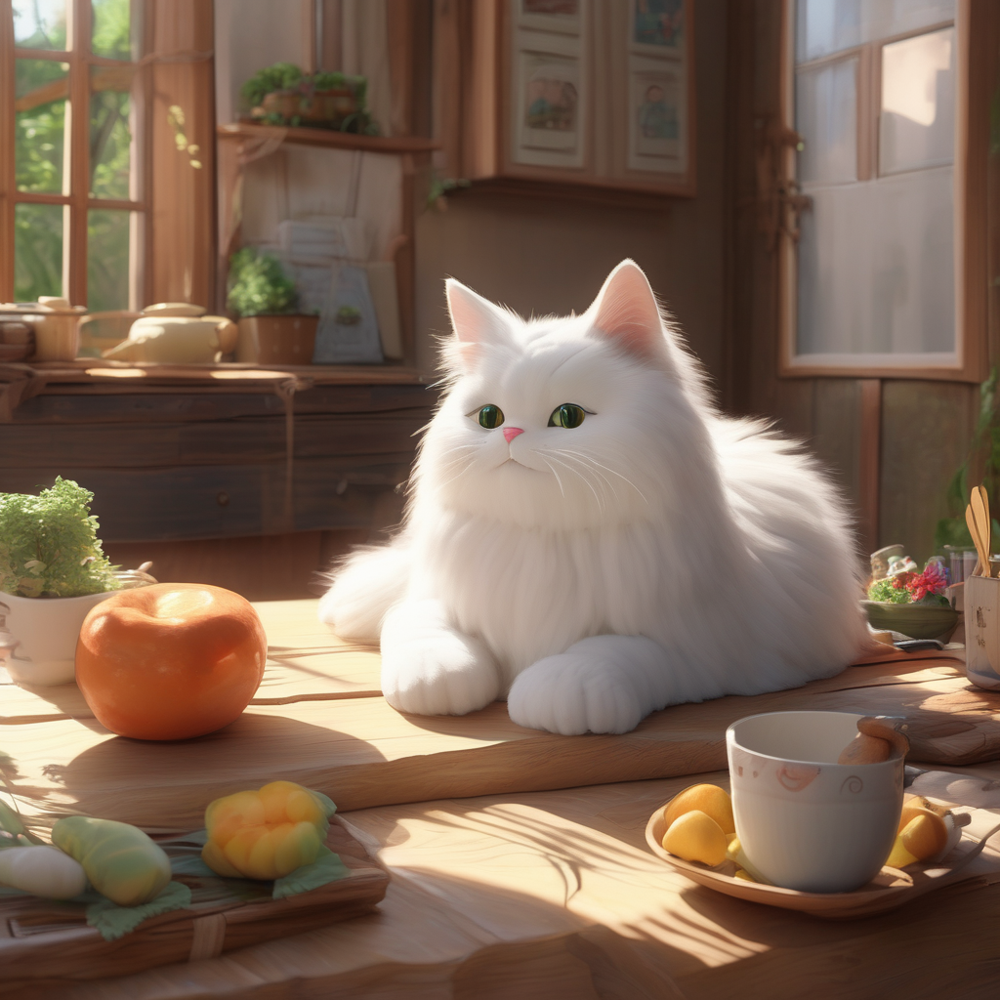

In [ ]:
# 지브리 스타일
from diffusers import AutoPipelineForText2Image
import torch

# Load SDXL
pipeline = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# Apply LoRA
apply_lora(
    pipeline,
    "ntc-ai/SDXL-LoRA-slider.Studio-Ghibli-style",
    "Studio Ghibli style.safetensors",
    adapter_name="ghibli",
    strength=2.5
)

# Set Prompt
positive_prompt = (
    "Studio Ghibli style, "
    "A fluffy white cat sitting on a wooden table with assorted fresh fruits, photorealistic lighting, "
    "warm afternoon sunlight, highly detailed cat face, soft fur, vibrant fruit textures, cozy room interior, 8k"
)

negative_prompt = (
    "blurry, deformed face, extra limbs, distorted fruits, low quality, low resolution, bad anatomy, "
    "mutated features, unnatural shadows"
)

# Generate Image
image = pipeline(prompt=positive_prompt, negative_prompt=negative_prompt).images[0]
image


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

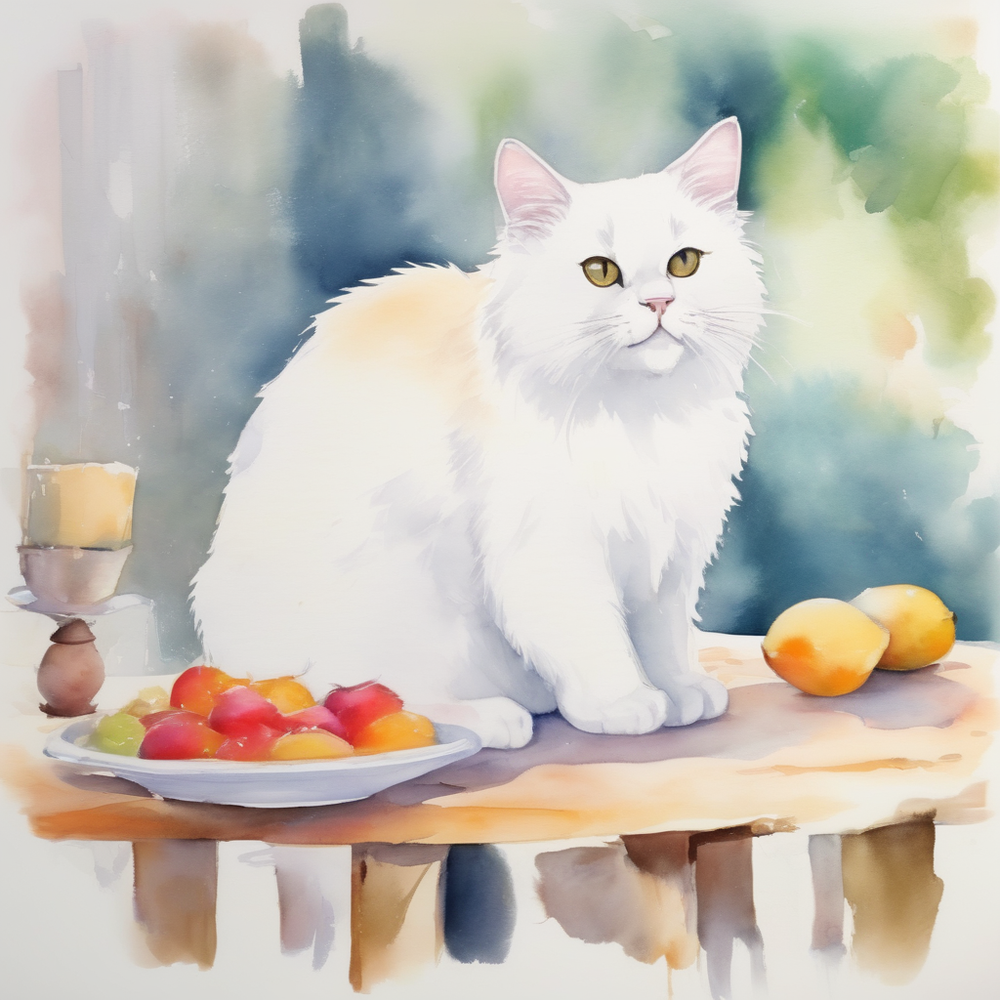

In [6]:
# Water Color 스타일
from diffusers import AutoPipelineForText2Image
import torch

# Load SDXL
pipeline = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# Apply LoRA
apply_lora(
    pipeline,
    "ostris/watercolor_style_lora_sdxl",
    "watercolor_v1_sdxl.safetensors",
    adapter_name="watercolor",
    strength=2.0
)

# Set Prompt
positive_prompt = (
    "A fluffy white cat sitting on a wooden table with assorted fresh fruits, photorealistic lighting, "
    "warm afternoon sunlight, highly detailed cat face, soft fur, vibrant fruit textures, cozy room interior, 8k"
)

negative_prompt = (
    "blurry, deformed face, extra limbs, distorted fruits, low quality, low resolution, bad anatomy, "
    "mutated features, unnatural shadows"
)

# Generate Image
image = pipeline(prompt=positive_prompt, negative_prompt=negative_prompt).images[0]
image


## 모델 비교 테스트 코드

### Load Model

In [1]:
# 모델별 Hugging Face 경로
model_dict = {
    "sd15": "runwayml/stable-diffusion-v1-5",
    # "sd21": "artificialguybr/freedom",  # 안됨
    "sdxl": "stabilityai/stable-diffusion-xl-base-1.0",
    "sd35m": "stabilityai/stable-diffusion-3.5-medium", # 얘도 로딩 잘 안됨
    # "flux": "모델 성능이 좋은거 같긴 한데, 최소 16gb 요구되는 모델로 보임"
}

# 모델별 기본 해상도
default_image_size = {
    "sd15": (512, 512),
    # "sd21": (768, 768),
    "sdxl": (1024, 1024),
    "sd35m": (1024, 1024),
}


#### Def

In [8]:
# Colab 환경에서 필요한 패키지 설치
%%capture
%pip install diffusers transformers accelerate
%pip install torch --upgrade

In [11]:
from diffusers import AutoPipelineForText2Image, StableDiffusionPipeline, StableDiffusion3Pipeline
from datetime import datetime
import torch
import gc
from PIL import Image
from IPython.display import display

def print_gpu_usage(stage=""):
    allocated = torch.cuda.memory_allocated() / 1e9
    reserved = torch.cuda.memory_reserved() / 1e9
    print(f"[GPU: {stage}] Allocated: {allocated:.2f} GB | Reserved: {reserved:.2f} GB")
    return allocated, reserved

def apply_lora(pipeline, lora_path, weight_file, adapter_name="default", strength=1.0):
    pipeline.load_lora_weights(
        lora_path,
        weight_name=weight_file,
        adapter_name=adapter_name
    )
    pipeline.set_adapters([adapter_name], adapter_weights=[strength])


In [12]:
def generate_image(
    model_version="sdxl",
    lora_path=None,
    lora_weight=None,
    adapter_name="style",
    strength=1.0,
    positive_prompt="a beautiful illustration",
    negative_prompt="blurry, low quality",
    image_size=None,
    save_dir="/content"
):
    print(f"\n=== Stable Diffusion [{model_version}] 시작 ===")

    # 자동 해상도 지정
    if image_size is None:
        image_size = default_image_size.get(model_version.lower(), (512, 512))

    model_id = model_dict.get(model_version.lower())
    if model_id is None:
        raise ValueError("지원되지 않는 모델입니다: sd15, sd21, sdxl, sd35m 중에서 선택하세요.")

    # 파이프라인 로딩
    print(f"[INFO] 모델 로딩 중: {model_id} @ {image_size}")
    if model_version == "sd35m":
        pipeline = StableDiffusion3Pipeline.from_pretrained(
            model_id,
            torch_dtype=torch.float16,
            use_safetensors=True
        ).to("cuda")
    elif model_version in ["sd15", "sd21"]:
        pipeline = StableDiffusionPipeline.from_pretrained(
            model_id,
            torch_dtype=torch.float16,
            use_safetensors=True
        ).to("cuda")
    else: # sdxl
        pipeline = AutoPipelineForText2Image.from_pretrained(
            model_id,
            torch_dtype=torch.float16,
            variant="fp16" if "xl" in model_version else None,
            use_safetensors=True
        ).to("cuda")

    base_alloc, _ = print_gpu_usage("Base 모델 로드 후")

    # LoRA 적용
    if lora_path and lora_weight:
        print(f"[INFO] LoRA 적용 중: {lora_weight}")
        apply_lora(pipeline, lora_path, lora_weight, adapter_name=adapter_name, strength=strength)

    # 이미지 생성
    print(f"[INFO] 이미지 생성 중...")
    with torch.no_grad():
        if model_version == "sd35m":
            image = pipeline(
                prompt=positive_prompt,
                negative_prompt=negative_prompt,
                height=image_size[1],
                width=image_size[0]
            ).images[0]
        else:
            image = pipeline(
                prompt=positive_prompt,
                negative_prompt=negative_prompt,
                height=image_size[1],
                width=image_size[0]
            ).images[0]
    print_gpu_usage("이미지 생성 후")

    # 저장 및 출력
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{save_dir}/gen_{model_version}_{adapter_name}_{timestamp}.png"
    image.save(filename)
    print(f"[INFO] 이미지 저장됨: {filename}")
    display(image)

    # 메모리 정리
    del image
    del pipeline
    gc.collect()
    torch.cuda.empty_cache()
    print("[INFO] 메모리 정리 완료 ✅\n")

    return filename

### Monitor + Prompt

In [17]:
print(f"Allocated: {torch.cuda.memory_allocated() / 1e9:.2f} GB")
print(f"Reserved : {torch.cuda.memory_reserved() / 1e9:.2f} GB")


Allocated: 5.21 GB
Reserved : 5.28 GB


In [10]:
from huggingface_hub import login
from google.colab import userdata

hf_token = userdata.get('HF_TOKEN')

if hf_token:
    login(token=hf_token)
    print("✅ Hugging Face 로그인 완료")
else:
    print("❌ Hugging Face 토큰을 찾을 수 없습니다. Colab의 비밀 키에 'HF_TOKEN'을 등록해주세요.")


✅ Hugging Face 로그인 완료


### Test

In [6]:
positive_prompt = (
    "a Japanese girl standing in the middle of a path covered with autumn leaves, "
    "a fluffy white cat beside her, soft warm sunlight, cinematic scene, "
    "highly detailed, full body, gentle expression, calm atmosphere"
)

negative_prompt = (
    "blurry, bad anatomy, distorted, low resolution, extra limbs, deformed cat"
)



=== Stable Diffusion [sd15] 시작 ===
[INFO] 모델 로딩 중: runwayml/stable-diffusion-v1-5 @ (512, 512)


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

[GPU: Base 모델 로드 후] Allocated: 2.78 GB | Reserved: 2.79 GB
[INFO] LoRA 적용 중: StudioGhibliRedmond-15V-LiberteRedmond-StdGBRedmAF-StudioGhibli.safetensors


(…)ond-StdGBRedmAF-StudioGhibli.safetensors:   0%|          | 0.00/37.9M [00:00<?, ?B/s]

[INFO] 이미지 생성 중...


  0%|          | 0/50 [00:00<?, ?it/s]

[GPU: 이미지 생성 후] Allocated: 2.83 GB | Reserved: 4.08 GB
[INFO] 이미지 저장됨: /content/gen_sd15_ghibli15_20250406_121932.png


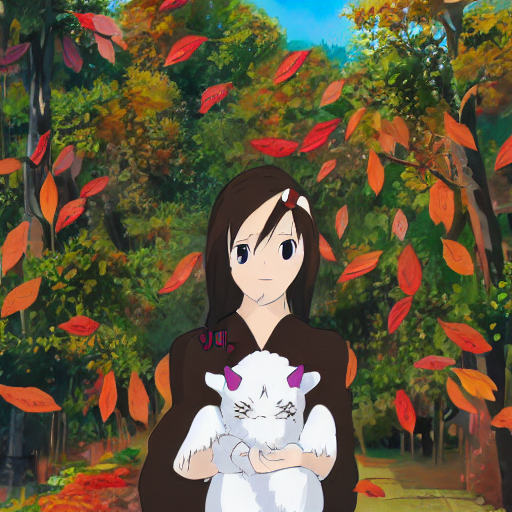

[INFO] 메모리 정리 완료 ✅



'/content/gen_sd15_ghibli15_20250406_121932.png'

In [14]:
generate_image(
    model_version="sd15",
    lora_path="artificialguybr/studioghibli-redmond-1-5v-studio-ghibli-lora-for-liberteredmond-sd-1-5",
    lora_weight="StudioGhibliRedmond-15V-LiberteRedmond-StdGBRedmAF-StudioGhibli.safetensors",
    adapter_name="ghibli15",
    strength=2.0,
    positive_prompt=positive_prompt,
    negative_prompt=negative_prompt
)


In [10]:
generate_image(
    model_version="sdxl",
    lora_path="ntc-ai/SDXL-LoRA-slider.Studio-Ghibli-style",
    lora_weight="Studio Ghibli style.safetensors",
    adapter_name="ghiblixl",
    strength=2.0,
    positive_prompt=positive_prompt,
    negative_prompt=negative_prompt
)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
generate_image(
    model_version="sd35m",
    lora_path="alvarobartt/ghibli-characters-sd3.5-lora",
    lora_weight="pytorch_lora_weights.safetensors",
    adapter_name="ghibli35m",
    strength=2.0,
    positive_prompt=positive_prompt,
    negative_prompt=negative_prompt
)


## SDXL Lora 학습 시도